In [1]:
# %matplotlib inline


# 1) Wipe out your namespace
%reset -f

# 2) Clear Jupyter’s stored outputs (and inputs if you like)
try:
    Out.clear()
except NameError:
    pass

try:
    In.clear()
except NameError:
    pass

# 3) Force Python GC
import gc
gc.collect()

# 4) Free any GPU buffers
import torch
if torch.cuda.is_available():
    torch.cuda.empty_cache()


import importlib
from libs import trades, plots, params
importlib.reload(trades)
importlib.reload(plots)
importlib.reload(params)

<module 'libs.params' from '/workspace/my_models/Trading/_Stock_Analysis_/libs/params.py'>

In [2]:
import sys
print(sys.executable)

import math
import pandas as pd
from pandas import Timestamp
pd.set_option('display.max_columns', None)

import numpy as np
import glob
import os
import json

import datetime as dt
from datetime import datetime
from pprint import pprint
from collections import OrderedDict

import matplotlib.pyplot as plt
import plotly.graph_objects as go
from IPython.display import display, HTML
import seaborn as sns

from typing import Optional, Dict, Tuple, List, Sequence
from sklearn.preprocessing import StandardScaler

from tqdm.auto import tqdm
tqdm.pandas()        

pd.set_option('display.max_columns', None)


/usr/bin/python


[main] Found existing base CSV: dfs/AAPL_1_base.csv


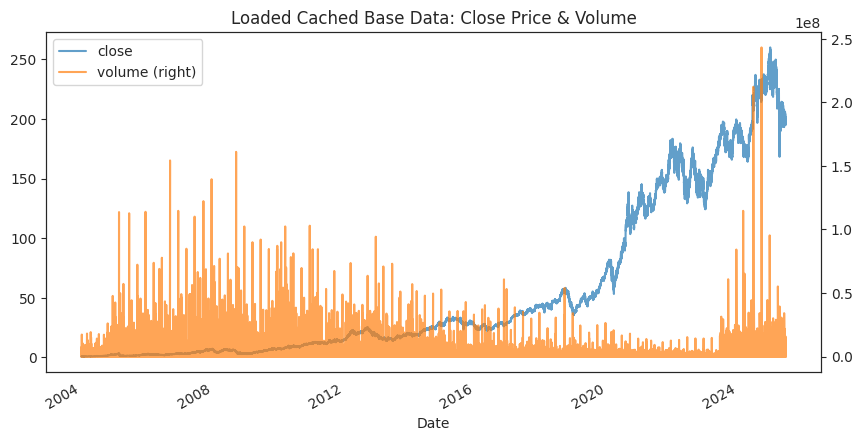

,open,high,low,close,volume,ask,bid
2004-01-02 09:00:00,0.764286,0.764286,0.764286,0.764286,28000.0,0.764439,0.764132
2004-01-02 09:01:00,0.764286,0.764286,0.764286,0.764286,28000.0,0.764439,0.764132
2004-01-02 09:02:00,0.764286,0.764286,0.764286,0.764286,28000.0,0.764439,0.764132
2004-01-02 09:03:00,0.764286,0.764286,0.764286,0.764286,28000.0,0.764439,0.764132
2004-01-02 09:04:00,0.764286,0.764286,0.764286,0.764286,28000.0,0.764439,0.764132
...,...,...,...,...,...,...,...
2025-06-18 20:56:00,196.680000,196.860000,196.630000,196.815000,385695.0,196.854400,196.775600
2025-06-18 20:57:00,196.810000,196.940000,196.560000,196.675000,460630.0,196.714300,196.635700
2025-06-18 20:58:00,196.675000,196.740000,196.630000,196.670000,525245.0,196.709300,196.630700
2025-06-18 20:59:00,196.680000,196.750000,196.240000,196.240000,2075503.0,196.279200,196.200800


In [3]:
base_csv = params.base_csv

if not params.createCSVbase and os.path.exists(base_csv):
    # -----------------------------------------------------------------
    # 1) Cached file exists → load it, plot it, skip all processing.
    # -----------------------------------------------------------------
    print(f"[main] Found existing base CSV: {base_csv}")
    df = pd.read_csv(base_csv, index_col=0, parse_dates=True)
    plots.plot_close_volume(
        df,
        title="Loaded Cached Base Data: Close Price & Volume"
    )

else:
    # -----------------------------------------------------------------
    # 2) No cached file → do the full split‐adjust and then minute‐grid prep
    # -----------------------------------------------------------------
    print(f"[main] Re-creating base CSV; running process_splits …")
    df_raw = trades.process_splits(
        folder              = params.stocks_folder,
        ticker              = params.ticker,
        bidask_spread_pct   = params.bidask_spread_pct
    )

    # Once‐only minute grid build and interpolation
    print(f"[main] Running prepare_interpolate_data …")
    df = trades.prepare_interpolate_data(
        df                = df_raw,
        sess_premark      = params.sess_premark,
        sess_end          = params.sess_end
    )
    
    # Persist to base CSV and return
    df.to_csv(base_csv)
    print(f"[process_splits] Saved processed data to: {base_csv}")

# df is now guaranteed to be the split‐adjusted, minute‐aligned DataFrame
df


In [4]:
best_optuna_value, best_optuna_params = params.load_sign_optuna_record(sig_type = "target")

print('best_optuna_value:', best_optuna_value)
print('best_optuna_params:', best_optuna_params)

# Run pipeline on entire month slice
sim_results = trades.run_trading_pipeline(
    df           = df,
    col_signal   = "signal",
    **best_optuna_params
)

# build df_sim from sim_results
print('Building the full df_sim ...')
df_sim = pd.concat([res[0] for _, res in sorted(sim_results.items())]).sort_index() 

best_optuna_value: 1.389531111111111
best_optuna_params: {'min_prof_thr': 0.02594269684355002, 'max_down_prop': 0.8591344863026342, 'gain_tightening_factor': 36.29620818119744, 'merging_retracement_thr': 0.3859497804687011, 'merging_time_gap_thr': 4.81073871049978, 'tau_time': 8, 'tau_dur': 229, 'trailstop_pct': 0.030364600350609013, 'buy_thresh': 0.11078059499255467, 'beta_sat': 17, 'smoothing_window': 1, 'sellmin_idx': None, 'sess_start': datetime.time(13, 30)}
Detecting & merging trades by day …
Computing raw continuous signals …
Smoothing, scaling & soft-saturating …


Generate trade action, simulate trading …: 100%|██████████| 5400/5400 [01:42<00:00, 52.78it/s]


Building the full df_sim ...


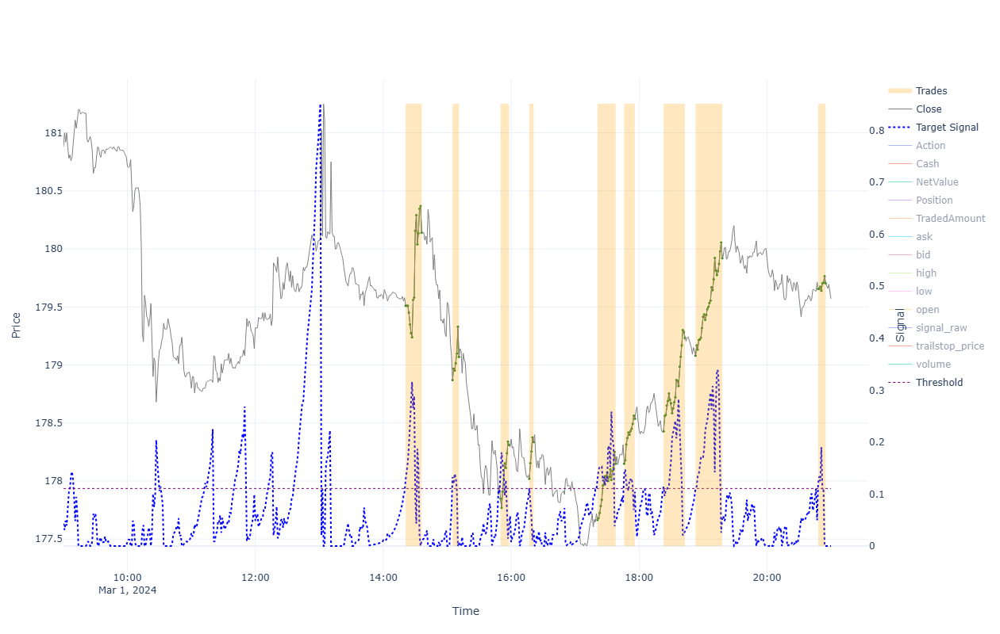


=== Performance for 2024-03-01 ===

BUY&HOLD:
  Bid(0) 179.534 - Ask(0) 179.826 - Fee(0) [0.004+0.029] = -0.325
TRADES:
  Bid(1) 180.104 - Ask(1) 179.546 - Fee(1) [0.004+0.029] = 0.525
  Bid(2) 179.034 - Ask(2) 178.906 - Fee(2) [0.004+0.029] = 0.095
  Bid(3) 178.274 - Ask(3) 177.886 - Fee(3) [0.004+0.029] = 0.356
  Bid(4) 178.3 - Ask(4) 178.056 - Fee(4) [0.004+0.029] = 0.212
  Bid(5) 178.114 - Ask(5) 177.701 - Fee(5) [0.004+0.029] = 0.381
  Bid(6) 178.501 - Ask(6) 178.186 - Fee(6) [0.004+0.029] = 0.283
  Bid(7) 179.197 - Ask(7) 178.465 - Fee(7) [0.004+0.029] = 0.699
  Bid(8) 179.884 - Ask(8) 179.116 - Fee(8) [0.004+0.029] = 0.735
  Bid(9) 179.667 - Ask(9) 179.691 - Fee(9) [0.004+0.029] = -0.057
STRATEGY:
  Trade(1) 0.525 + Trade(2) 0.095 + Trade(3) 0.356 + Trade(4) 0.212 + Trade(5) 0.381 + Trade(6) 0.283 + Trade(7) 0.699 + Trade(8) 0.735 + Trade(9) -0.057 = 3.229

------------------------------------------------------------------------------------------------------------------------



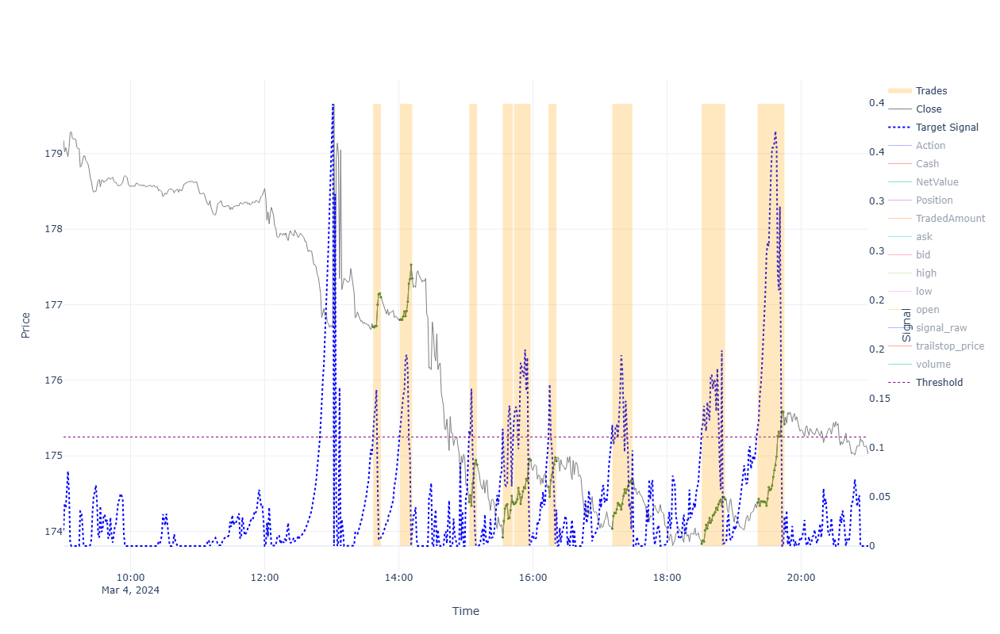


=== Performance for 2024-03-04 ===

BUY&HOLD:
  Bid(0) 174.985 - Ask(0) 176.78 - Fee(0) [0.004+0.028] = -1.828
TRADES:
  Bid(1) 177.065 - Ask(1) 176.745 - Fee(1) [0.004+0.029] = 0.287
  Bid(2) 177.315 - Ask(2) 176.835 - Fee(2) [0.004+0.029] = 0.446
  Bid(3) 174.848 - Ask(3) 174.425 - Fee(3) [0.004+0.028] = 0.391
  Bid(4) 174.35 - Ask(4) 173.956 - Fee(4) [0.004+0.028] = 0.362
  Bid(5) 174.905 - Ask(5) 174.397 - Fee(5) [0.004+0.028] = 0.476
  Bid(6) 174.895 - Ask(6) 174.625 - Fee(6) [0.004+0.028] = 0.238
  Bid(7) 174.592 - Ask(7) 174.07 - Fee(7) [0.004+0.028] = 0.49
  Bid(8) 174.39 - Ask(8) 173.872 - Fee(8) [0.004+0.028] = 0.486
  Bid(9) 175.385 - Ask(9) 174.415 - Fee(9) [0.004+0.028] = 0.937
STRATEGY:
  Trade(1) 0.287 + Trade(2) 0.446 + Trade(3) 0.391 + Trade(4) 0.362 + Trade(5) 0.476 + Trade(6) 0.238 + Trade(7) 0.49 + Trade(8) 0.486 + Trade(9) 0.937 = 4.113

------------------------------------------------------------------------------------------------------------------------



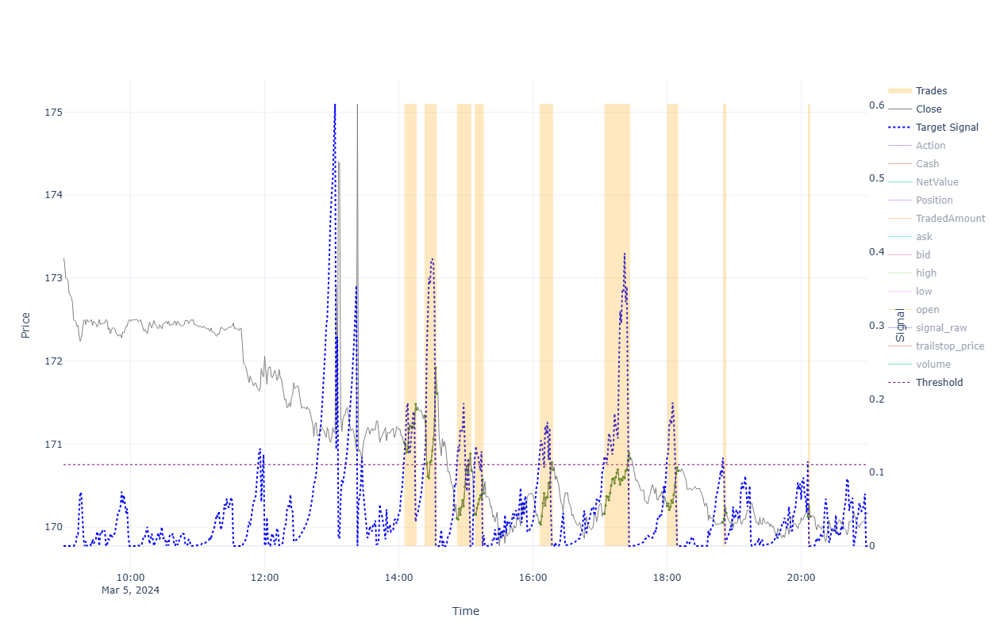


=== Performance for 2024-03-05 ===

BUY&HOLD:
  Bid(0) 170.136 - Ask(0) 171.144 - Fee(0) [0.004+0.028] = -1.04
TRADES:
  Bid(1) 171.386 - Ask(1) 171.054 - Fee(1) [0.004+0.028] = 0.3
  Bid(2) 171.576 - Ask(2) 171.374 - Fee(2) [0.004+0.028] = 0.17
  Bid(3) 170.644 - Ask(3) 170.143 - Fee(3) [0.004+0.028] = 0.469
  Bid(4) 170.376 - Ask(4) 170.194 - Fee(4) [0.004+0.028] = 0.15
  Bid(5) 170.656 - Ask(5) 170.089 - Fee(5) [0.004+0.028] = 0.535
  Bid(6) 170.791 - Ask(6) 170.195 - Fee(6) [0.004+0.028] = 0.564
  Bid(7) 170.646 - Ask(7) 170.289 - Fee(7) [0.004+0.028] = 0.325
  Bid(8) 170.136 - Ask(8) 170.089 - Fee(8) [0.004+0.028] = 0.015
  Bid(9) 170.096 - Ask(9) 170.164 - Fee(9) [0.004+0.028] = -0.1
STRATEGY:
  Trade(1) 0.3 + Trade(2) 0.17 + Trade(3) 0.469 + Trade(4) 0.15 + Trade(5) 0.535 + Trade(6) 0.564 + Trade(7) 0.325 + Trade(8) 0.015 + Trade(9) -0.1 = 2.428

------------------------------------------------------------------------------------------------------------------------



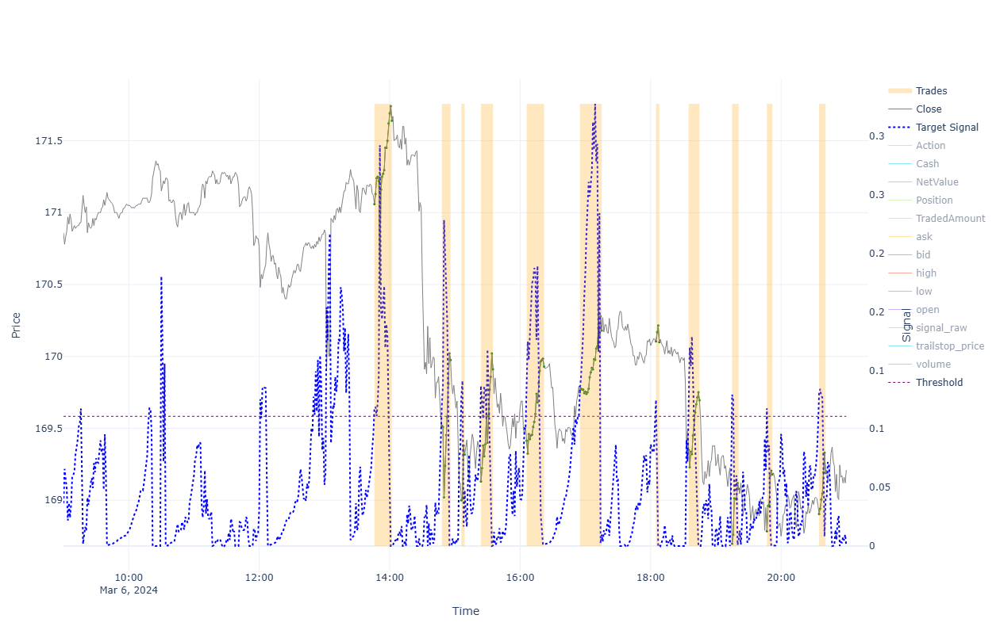


=== Performance for 2024-03-06 ===

BUY&HOLD:
  Bid(0) 169.176 - Ask(0) 171.224 - Fee(0) [0.004+0.028] = -2.08
TRADES:
  Bid(1) 171.606 - Ask(1) 171.094 - Fee(1) [0.004+0.028] = 0.48
  Bid(2) 169.941 - Ask(2) 169.551 - Fee(2) [0.004+0.028] = 0.358
  Bid(3) 169.284 - Ask(3) 169.034 - Fee(3) [0.004+0.028] = 0.218
  Bid(4) 169.876 - Ask(4) 169.164 - Fee(4) [0.004+0.028] = 0.681
  Bid(5) 169.896 - Ask(5) 169.449 - Fee(5) [0.004+0.028] = 0.415
  Bid(6) 170.146 - Ask(6) 169.784 - Fee(6) [0.004+0.028] = 0.33
  Bid(7) 170.066 - Ask(7) 170.139 - Fee(7) [0.004+0.028] = -0.105
  Bid(8) 169.661 - Ask(8) 169.384 - Fee(8) [0.004+0.028] = 0.246
  Bid(9) 169.046 - Ask(9) 168.732 - Fee(9) [0.004+0.028] = 0.283
  Bid(10) 169.146 - Ask(10) 168.819 - Fee(10) [0.004+0.028] = 0.296
  Bid(11) 169.156 - Ask(11) 168.939 - Fee(11) [0.004+0.028] = 0.185
STRATEGY:
  Trade(1) 0.48 + Trade(2) 0.358 + Trade(3) 0.218 + Trade(4) 0.681 + Trade(5) 0.415 + Trade(6) 0.33 + Trade(7) -0.105 + Trade(8) 0.246 + Trade(9) 0.28

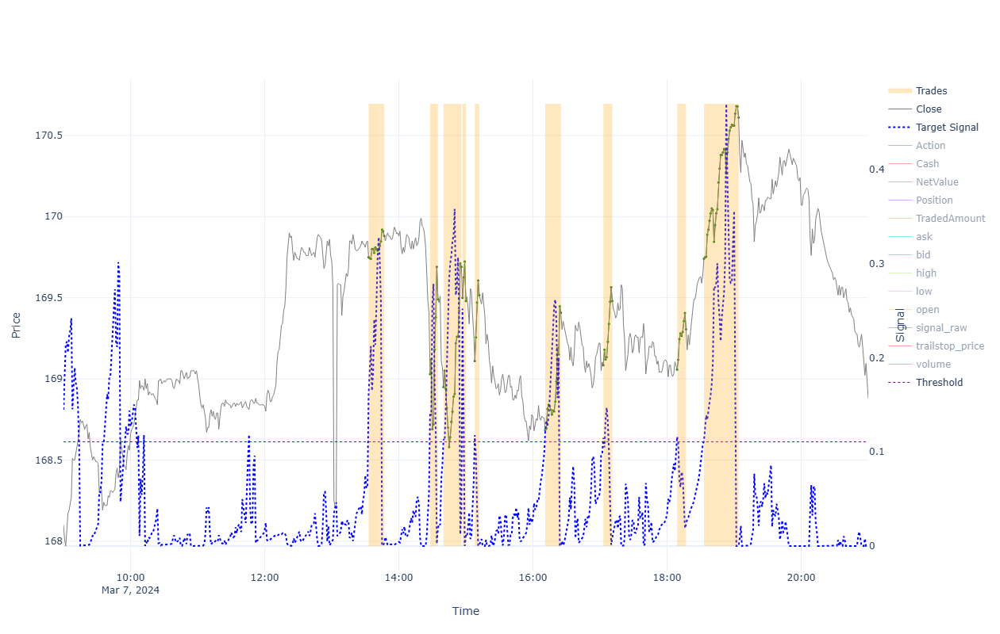


=== Performance for 2024-03-07 ===

BUY&HOLD:
  Bid(0) 168.846 - Ask(0) 169.844 - Fee(0) [0.004+0.027] = -1.029
TRADES:
  Bid(1) 169.846 - Ask(1) 169.784 - Fee(1) [0.004+0.028] = 0.03
  Bid(2) 169.456 - Ask(2) 169.064 - Fee(2) [0.004+0.028] = 0.361
  Bid(3) 169.656 - Ask(3) 168.984 - Fee(3) [0.004+0.028] = 0.641
  Bid(4) 169.446 - Ask(4) 169.534 - Fee(4) [0.004+0.028] = -0.119
  Bid(5) 169.481 - Ask(5) 169.144 - Fee(5) [0.004+0.028] = 0.306
  Bid(6) 169.375 - Ask(6) 168.719 - Fee(6) [0.004+0.028] = 0.624
  Bid(7) 169.446 - Ask(7) 169.119 - Fee(7) [0.004+0.028] = 0.296
  Bid(8) 169.271 - Ask(8) 169.091 - Fee(8) [0.004+0.028] = 0.148
  Bid(9) 170.576 - Ask(9) 169.774 - Fee(9) [0.004+0.028] = 0.77
STRATEGY:
  Trade(1) 0.03 + Trade(2) 0.361 + Trade(3) 0.641 + Trade(4) -0.119 + Trade(5) 0.306 + Trade(6) 0.624 + Trade(7) 0.296 + Trade(8) 0.148 + Trade(9) 0.77 = 3.057

------------------------------------------------------------------------------------------------------------------------



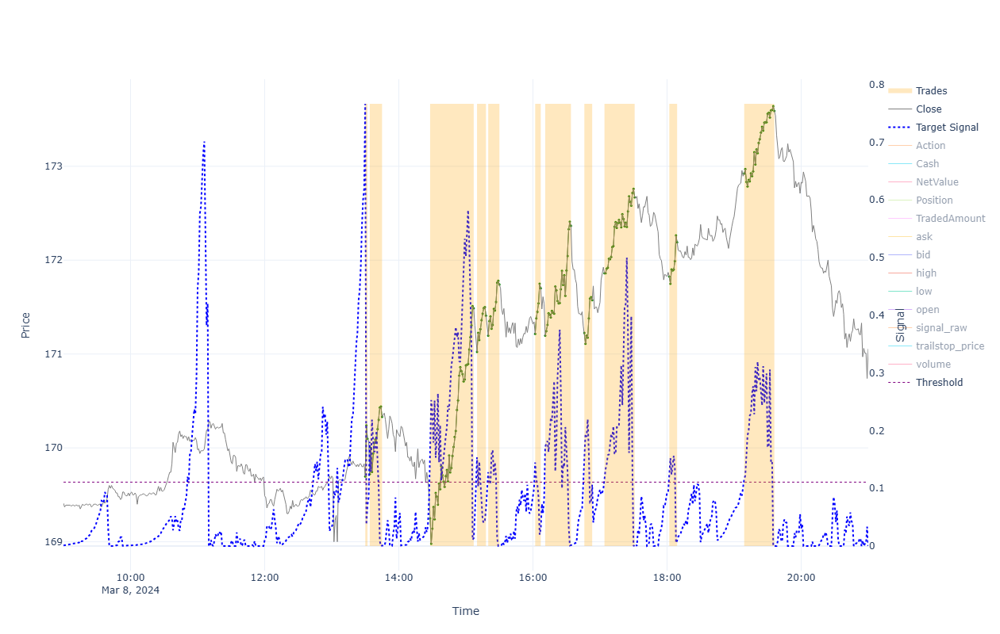


=== Performance for 2024-03-08 ===

BUY&HOLD:
  Bid(0) 171.021 - Ask(0) 169.729 - Fee(0) [0.004+0.028] = 1.26
TRADES:
  Bid(1) 170.062 - Ask(1) 169.729 - Fee(1) [0.004+0.028] = 0.301
  Bid(2) 170.296 - Ask(2) 169.754 - Fee(2) [0.004+0.028] = 0.51
  Bid(3) 171.453 - Ask(3) 169.284 - Fee(3) [0.004+0.028] = 2.138
  Bid(4) 171.376 - Ask(4) 171.058 - Fee(4) [0.004+0.028] = 0.286
  Bid(5) 171.706 - Ask(5) 171.23 - Fee(5) [0.004+0.028] = 0.443
  Bid(6) 171.666 - Ask(6) 171.249 - Fee(6) [0.004+0.028] = 0.385
  Bid(7) 172.331 - Ask(7) 171.23 - Fee(7) [0.004+0.028] = 1.069
  Bid(8) 171.539 - Ask(8) 171.259 - Fee(8) [0.004+0.028] = 0.248
  Bid(9) 172.636 - Ask(9) 171.894 - Fee(9) [0.004+0.028] = 0.709
  Bid(10) 172.156 - Ask(10) 171.859 - Fee(10) [0.004+0.028] = 0.264
  Bid(11) 173.555 - Ask(11) 172.956 - Fee(11) [0.004+0.028] = 0.567
STRATEGY:
  Trade(1) 0.301 + Trade(2) 0.51 + Trade(3) 2.138 + Trade(4) 0.286 + Trade(5) 0.443 + Trade(6) 0.385 + Trade(7) 1.069 + Trade(8) 0.248 + Trade(9) 0.709 +

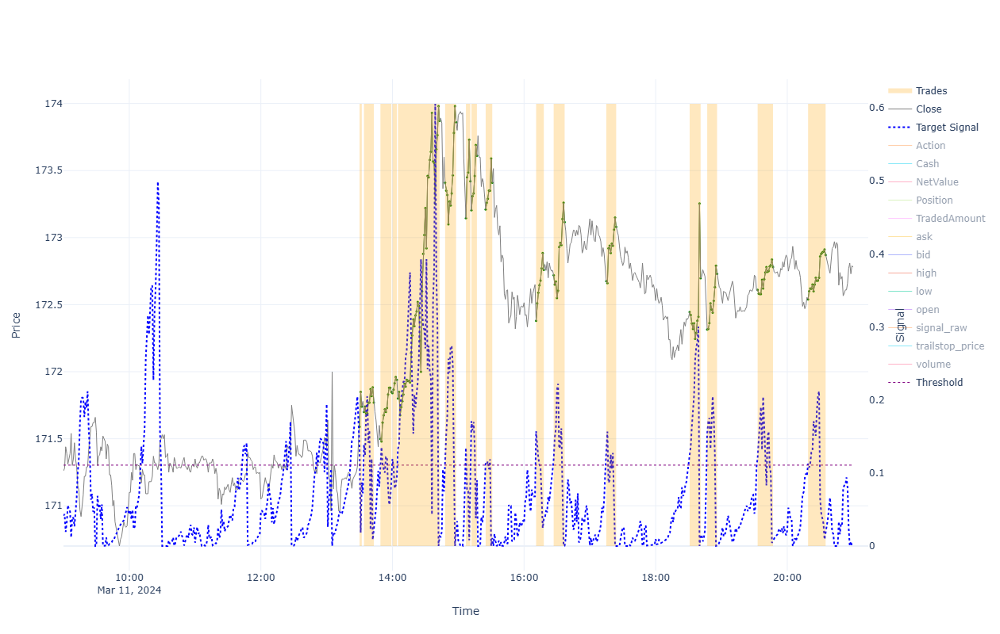


=== Performance for 2024-03-11 ===

BUY&HOLD:
  Bid(0) 172.745 - Ask(0) 171.624 - Fee(0) [0.004+0.028] = 1.089
TRADES:
  Bid(1) 171.706 - Ask(1) 171.624 - Fee(1) [0.004+0.028] = 0.05
  Bid(2) 171.736 - Ask(2) 171.734 - Fee(2) [0.004+0.028] = -0.031
  Bid(3) 171.816 - Ask(3) 171.534 - Fee(3) [0.004+0.028] = 0.249
  Bid(4) 171.906 - Ask(4) 171.874 - Fee(4) [0.004+0.028] = -0.001
  Bid(5) 173.835 - Ask(5) 171.834 - Fee(5) [0.004+0.028] = 1.969
  Bid(6) 173.825 - Ask(6) 173.445 - Fee(6) [0.004+0.028] = 0.348
  Bid(7) 173.385 - Ask(7) 173.18 - Fee(7) [0.004+0.028] = 0.174
  Bid(8) 173.575 - Ask(8) 173.239 - Fee(8) [0.004+0.028] = 0.305
  Bid(9) 173.375 - Ask(9) 173.245 - Fee(9) [0.004+0.028] = 0.099
  Bid(10) 172.725 - Ask(10) 172.415 - Fee(10) [0.004+0.028] = 0.279
  Bid(11) 173.081 - Ask(11) 172.755 - Fee(11) [0.004+0.028] = 0.295
  Bid(12) 173.045 - Ask(12) 172.709 - Fee(12) [0.004+0.028] = 0.304
  Bid(13) 172.663 - Ask(13) 172.48 - Fee(13) [0.004+0.028] = 0.151
  Bid(14) 172.696 - Ask(

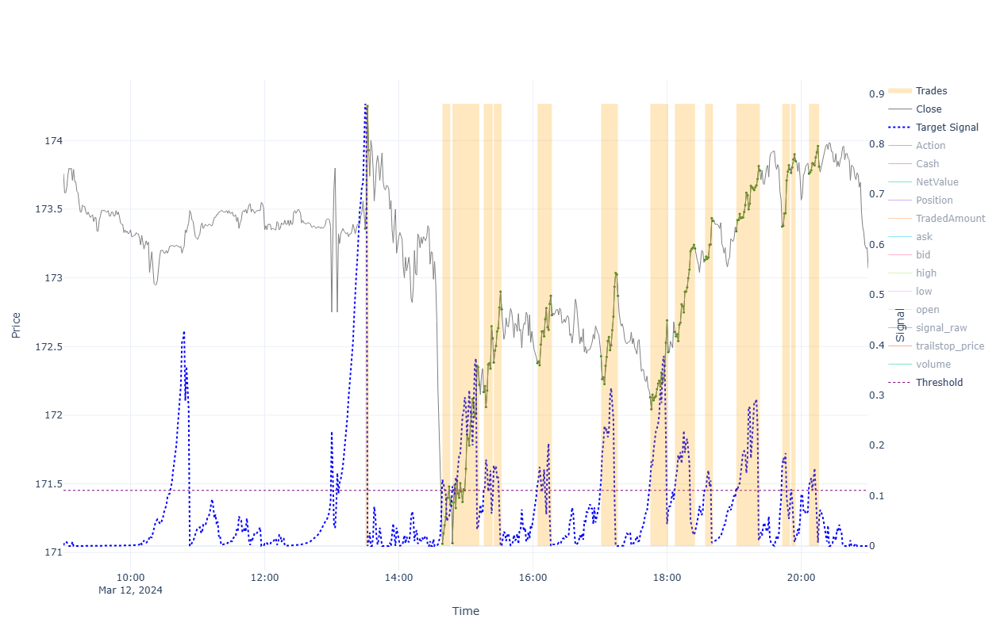


=== Performance for 2024-03-12 ===

BUY&HOLD:
  Bid(0) 173.035 - Ask(0) 173.395 - Fee(0) [0.004+0.028] = -0.391
TRADES:
  Bid(1) 173.895 - Ask(1) 173.395 - Fee(1) [0.004+0.028] = 0.468
  Bid(2) 171.316 - Ask(2) 171.099 - Fee(2) [0.004+0.028] = 0.185
  Bid(3) 172.186 - Ask(3) 171.104 - Fee(3) [0.004+0.028] = 1.049
  Bid(4) 172.526 - Ask(4) 172.204 - Fee(4) [0.004+0.028] = 0.289
  Bid(5) 172.737 - Ask(5) 172.419 - Fee(5) [0.004+0.028] = 0.285
  Bid(6) 172.696 - Ask(6) 172.415 - Fee(6) [0.004+0.028] = 0.249
  Bid(7) 172.835 - Ask(7) 172.464 - Fee(7) [0.004+0.028] = 0.339
  Bid(8) 172.425 - Ask(8) 172.166 - Fee(8) [0.004+0.028] = 0.228
  Bid(9) 173.18 - Ask(9) 172.642 - Fee(9) [0.004+0.028] = 0.506
  Bid(10) 173.38 - Ask(10) 173.165 - Fee(10) [0.004+0.028] = 0.184
  Bid(11) 173.746 - Ask(11) 173.375 - Fee(11) [0.004+0.028] = 0.339
  Bid(12) 173.755 - Ask(12) 173.41 - Fee(12) [0.004+0.028] = 0.313
  Bid(13) 173.815 - Ask(13) 173.8 - Fee(13) [0.004+0.028] = -0.017
  Bid(14) 173.775 - Ask(14

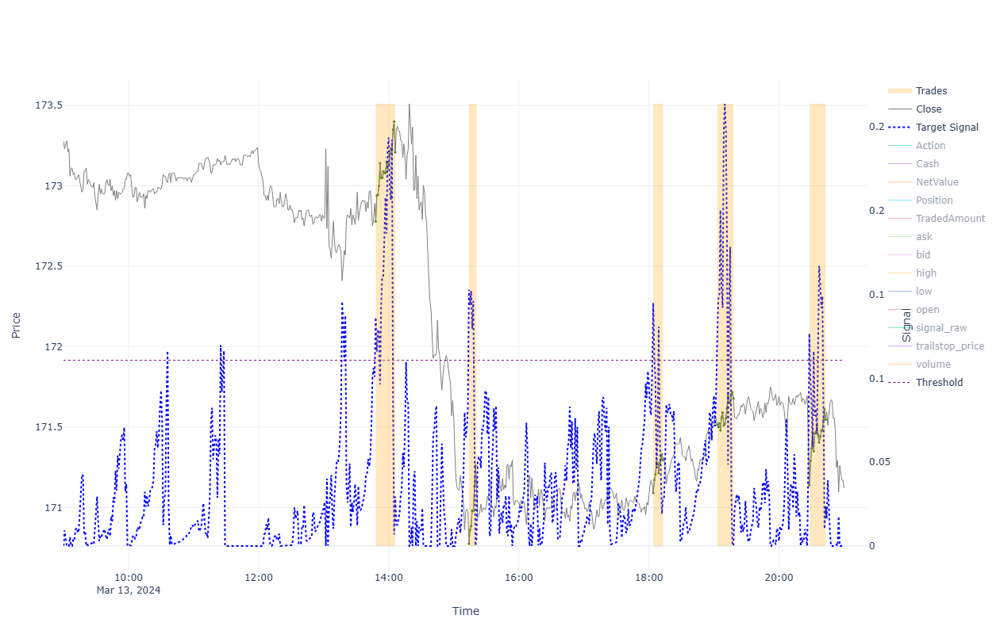


=== Performance for 2024-03-13 ===

BUY&HOLD:
  Bid(0) 171.086 - Ask(0) 172.865 - Fee(0) [0.004+0.028] = -1.811
TRADES:
  Bid(1) 173.175 - Ask(1) 172.815 - Fee(1) [0.004+0.028] = 0.329
  Bid(2) 171.116 - Ask(2) 170.809 - Fee(2) [0.004+0.028] = 0.275
  Bid(3) 171.261 - Ask(3) 171.124 - Fee(3) [0.004+0.028] = 0.105
  Bid(4) 171.643 - Ask(4) 171.549 - Fee(4) [0.004+0.028] = 0.062
  Bid(5) 171.513 - Ask(5) 171.174 - Fee(5) [0.004+0.028] = 0.307
STRATEGY:
  Trade(1) 0.329 + Trade(2) 0.275 + Trade(3) 0.105 + Trade(4) 0.062 + Trade(5) 0.307 = 1.078

------------------------------------------------------------------------------------------------------------------------



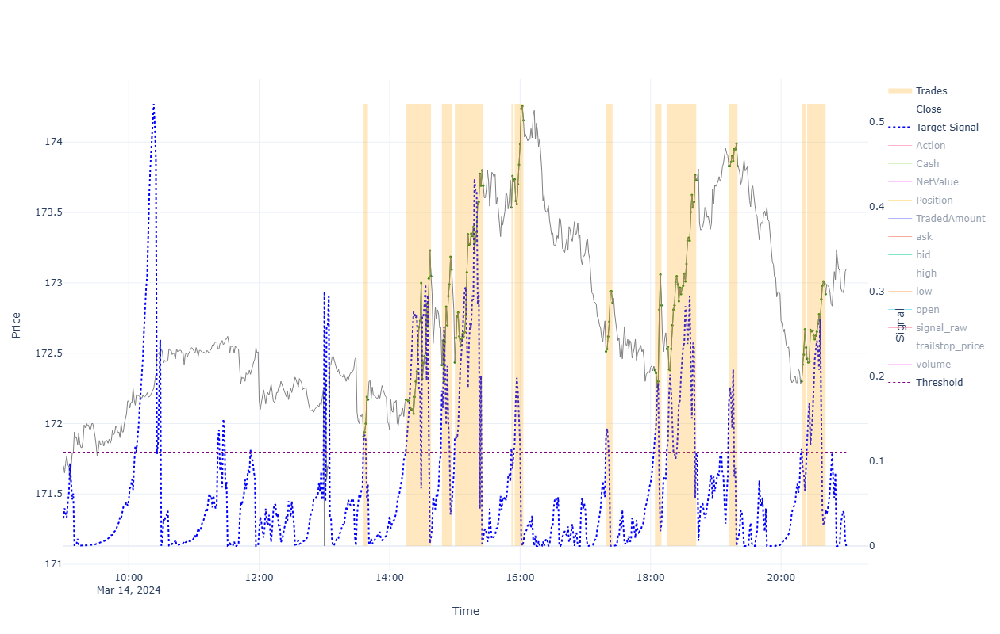


=== Performance for 2024-03-14 ===

BUY&HOLD:
  Bid(0) 173.065 - Ask(0) 172.114 - Fee(0) [0.004+0.028] = 0.919
TRADES:
  Bid(1) 172.136 - Ask(1) 171.944 - Fee(1) [0.004+0.028] = 0.159
  Bid(2) 173.014 - Ask(2) 172.204 - Fee(2) [0.004+0.028] = 0.777
  Bid(3) 173.06 - Ask(3) 172.451 - Fee(3) [0.004+0.028] = 0.578
  Bid(4) 173.655 - Ask(4) 172.47 - Fee(4) [0.004+0.028] = 1.154
  Bid(5) 173.69 - Ask(5) 173.57 - Fee(5) [0.004+0.028] = 0.088
  Bid(6) 174.12 - Ask(6) 173.77 - Fee(6) [0.004+0.028] = 0.318
  Bid(7) 172.825 - Ask(7) 172.547 - Fee(7) [0.004+0.028] = 0.247
  Bid(8) 172.805 - Ask(8) 172.415 - Fee(8) [0.004+0.028] = 0.359
  Bid(9) 173.695 - Ask(9) 172.565 - Fee(9) [0.004+0.028] = 1.099
  Bid(10) 173.795 - Ask(10) 173.865 - Fee(10) [0.004+0.028] = -0.102
  Bid(11) 172.506 - Ask(11) 172.334 - Fee(11) [0.004+0.028] = 0.139
  Bid(12) 172.885 - Ask(12) 172.495 - Fee(12) [0.004+0.028] = 0.359
STRATEGY:
  Trade(1) 0.159 + Trade(2) 0.777 + Trade(3) 0.578 + Trade(4) 1.154 + Trade(5) 0.088 +

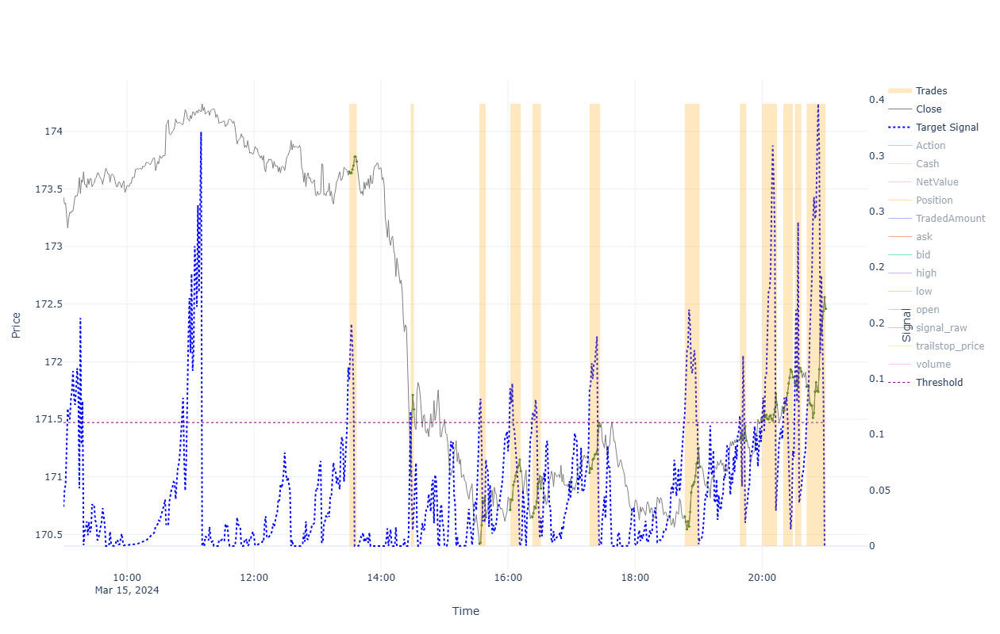


=== Performance for 2024-03-15 ===

BUY&HOLD:
  Bid(0) 172.425 - Ask(0) 173.685 - Fee(0) [0.004+0.028] = -1.291
TRADES:
  Bid(1) 173.705 - Ask(1) 173.685 - Fee(1) [0.004+0.028] = -0.012
  Bid(2) 171.553 - Ask(2) 171.064 - Fee(2) [0.004+0.028] = 0.457
  Bid(3) 170.616 - Ask(3) 170.454 - Fee(3) [0.004+0.028] = 0.13
  Bid(4) 171.016 - Ask(4) 170.749 - Fee(4) [0.004+0.028] = 0.235
  Bid(5) 170.866 - Ask(5) 170.684 - Fee(5) [0.004+0.028] = 0.15
  Bid(6) 171.406 - Ask(6) 171.07 - Fee(6) [0.004+0.028] = 0.304
  Bid(7) 171.053 - Ask(7) 170.689 - Fee(7) [0.004+0.028] = 0.332
  Bid(8) 171.281 - Ask(8) 171.358 - Fee(8) [0.004+0.028] = -0.11
  Bid(9) 171.591 - Ask(9) 171.524 - Fee(9) [0.004+0.028] = 0.035
  Bid(10) 171.831 - Ask(10) 171.614 - Fee(10) [0.004+0.028] = 0.184
  Bid(11) 171.881 - Ask(11) 171.849 - Fee(11) [0.004+0.028] = -0.001
  Bid(12) 172.425 - Ask(12) 171.819 - Fee(12) [0.004+0.028] = 0.574
STRATEGY:
  Trade(1) -0.012 + Trade(2) 0.457 + Trade(3) 0.13 + Trade(4) 0.235 + Trade(5) 0.

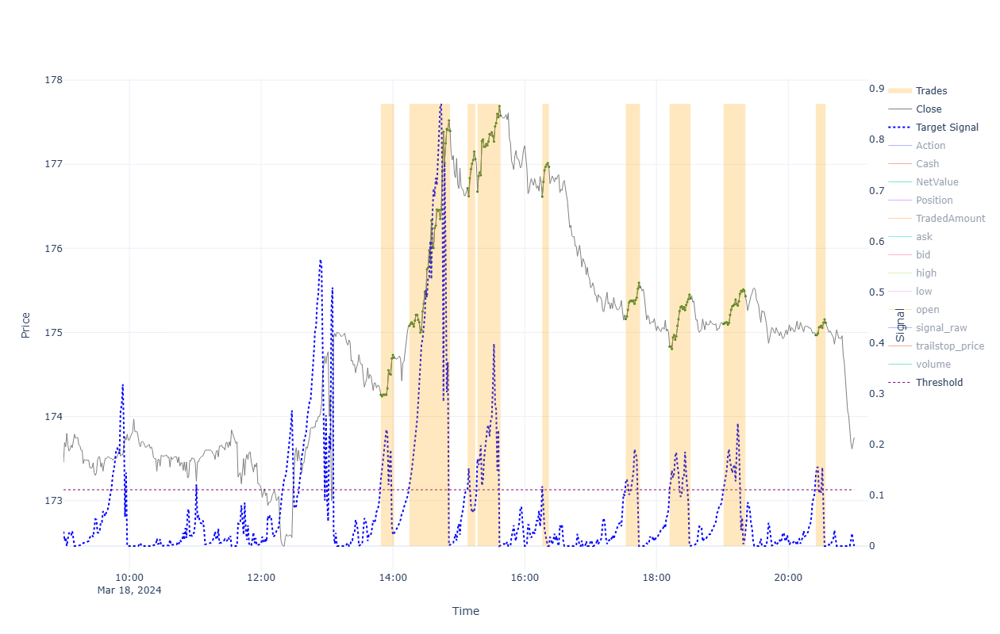


=== Performance for 2024-03-18 ===

BUY&HOLD:
  Bid(0) 173.715 - Ask(0) 174.685 - Fee(0) [0.004+0.028] = -1.002
TRADES:
  Bid(1) 174.665 - Ask(1) 174.295 - Fee(1) [0.004+0.028] = 0.338
  Bid(2) 177.359 - Ask(2) 175.115 - Fee(2) [0.004+0.029] = 2.212
  Bid(3) 177.025 - Ask(3) 176.751 - Fee(3) [0.004+0.029] = 0.241
  Bid(4) 177.544 - Ask(4) 176.71 - Fee(4) [0.004+0.029] = 0.801
  Bid(5) 176.935 - Ask(5) 176.65 - Fee(5) [0.004+0.029] = 0.252
  Bid(6) 175.505 - Ask(6) 175.195 - Fee(6) [0.004+0.028] = 0.277
  Bid(7) 175.37 - Ask(7) 174.867 - Fee(7) [0.004+0.028] = 0.47
  Bid(8) 175.396 - Ask(8) 175.135 - Fee(8) [0.004+0.028] = 0.228
  Bid(9) 175.081 - Ask(9) 175.005 - Fee(9) [0.004+0.028] = 0.044
STRATEGY:
  Trade(1) 0.338 + Trade(2) 2.212 + Trade(3) 0.241 + Trade(4) 0.801 + Trade(5) 0.252 + Trade(6) 0.277 + Trade(7) 0.47 + Trade(8) 0.228 + Trade(9) 0.044 = 4.863

------------------------------------------------------------------------------------------------------------------------



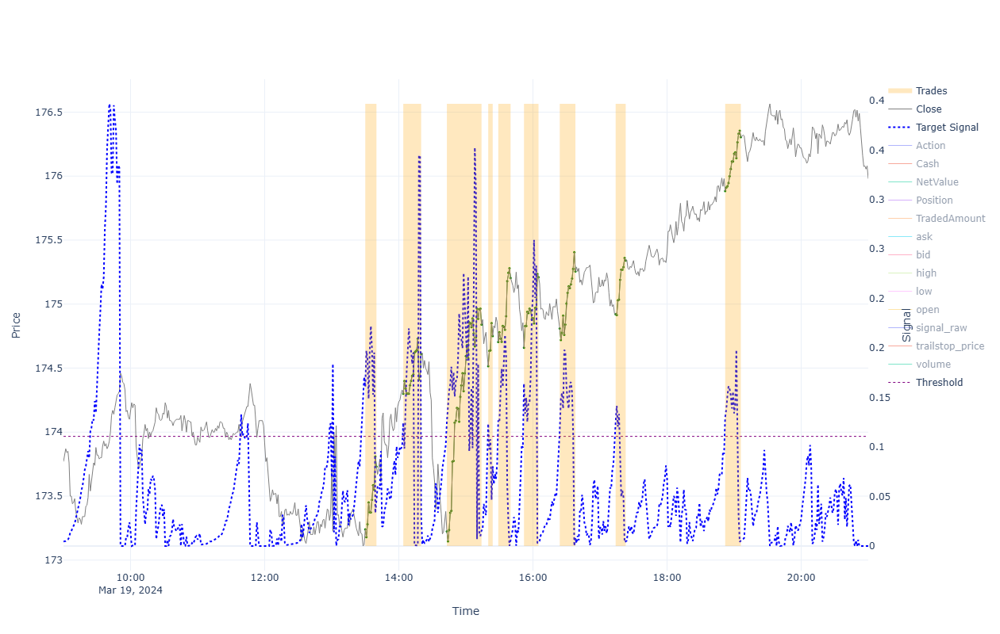


=== Performance for 2024-03-19 ===

BUY&HOLD:
  Bid(0) 175.945 - Ask(0) 173.275 - Fee(0) [0.004+0.028] = 2.638
TRADES:
  Bid(1) 173.695 - Ask(1) 173.275 - Fee(1) [0.004+0.028] = 0.389
  Bid(2) 174.575 - Ask(2) 174.335 - Fee(2) [0.004+0.028] = 0.208
  Bid(3) 174.805 - Ask(3) 173.26 - Fee(3) [0.004+0.028] = 1.513
  Bid(4) 174.715 - Ask(4) 174.55 - Fee(4) [0.004+0.028] = 0.133
  Bid(5) 175.17 - Ask(5) 174.74 - Fee(5) [0.004+0.028] = 0.398
  Bid(6) 175.176 - Ask(6) 174.695 - Fee(6) [0.004+0.028] = 0.449
  Bid(7) 175.22 - Ask(7) 174.845 - Fee(7) [0.004+0.028] = 0.343
  Bid(8) 175.305 - Ask(8) 174.956 - Fee(8) [0.004+0.028] = 0.316
  Bid(9) 176.27 - Ask(9) 175.919 - Fee(9) [0.004+0.029] = 0.318
STRATEGY:
  Trade(1) 0.389 + Trade(2) 0.208 + Trade(3) 1.513 + Trade(4) 0.133 + Trade(5) 0.398 + Trade(6) 0.449 + Trade(7) 0.343 + Trade(8) 0.316 + Trade(9) 0.318 = 4.067

------------------------------------------------------------------------------------------------------------------------



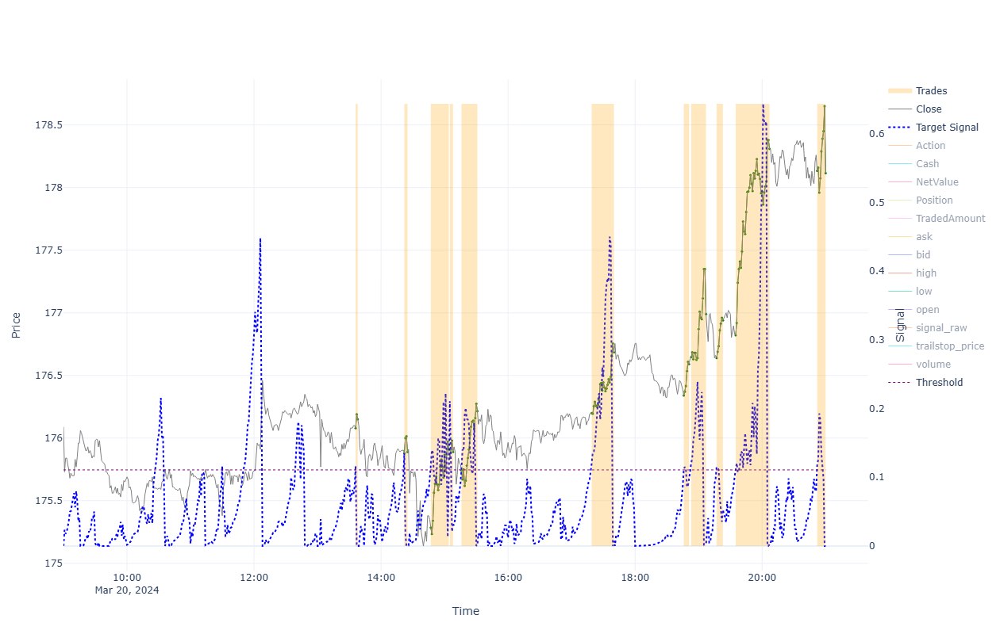


=== Performance for 2024-03-20 ===

BUY&HOLD:
  Bid(0) 178.079 - Ask(0) 176.035 - Fee(0) [0.004+0.029] = 2.011
TRADES:
  Bid(1) 176.115 - Ask(1) 176.115 - Fee(1) [0.004+0.028] = -0.033
  Bid(2) 175.855 - Ask(2) 175.915 - Fee(2) [0.004+0.028] = -0.093
  Bid(3) 175.875 - Ask(3) 175.32 - Fee(3) [0.004+0.028] = 0.522
  Bid(4) 175.855 - Ask(4) 175.875 - Fee(4) [0.004+0.028] = -0.053
  Bid(5) 176.18 - Ask(5) 175.775 - Fee(5) [0.004+0.029] = 0.372
  Bid(6) 176.65 - Ask(6) 176.235 - Fee(6) [0.004+0.029] = 0.382
  Bid(7) 176.555 - Ask(7) 176.375 - Fee(7) [0.004+0.029] = 0.147
  Bid(8) 176.955 - Ask(8) 176.68 - Fee(8) [0.004+0.029] = 0.242
  Bid(9) 176.905 - Ask(9) 176.675 - Fee(9) [0.004+0.029] = 0.197
  Bid(10) 178.274 - Ask(10) 176.857 - Fee(10) [0.004+0.029] = 1.385
  Bid(11) 178.079 - Ask(11) 178.17 - Fee(11) [0.004+0.029] = -0.123
STRATEGY:
  Trade(1) -0.033 + Trade(2) -0.093 + Trade(3) 0.522 + Trade(4) -0.053 + Trade(5) 0.372 + Trade(6) 0.382 + Trade(7) 0.147 + Trade(8) 0.242 + Trade(9) 

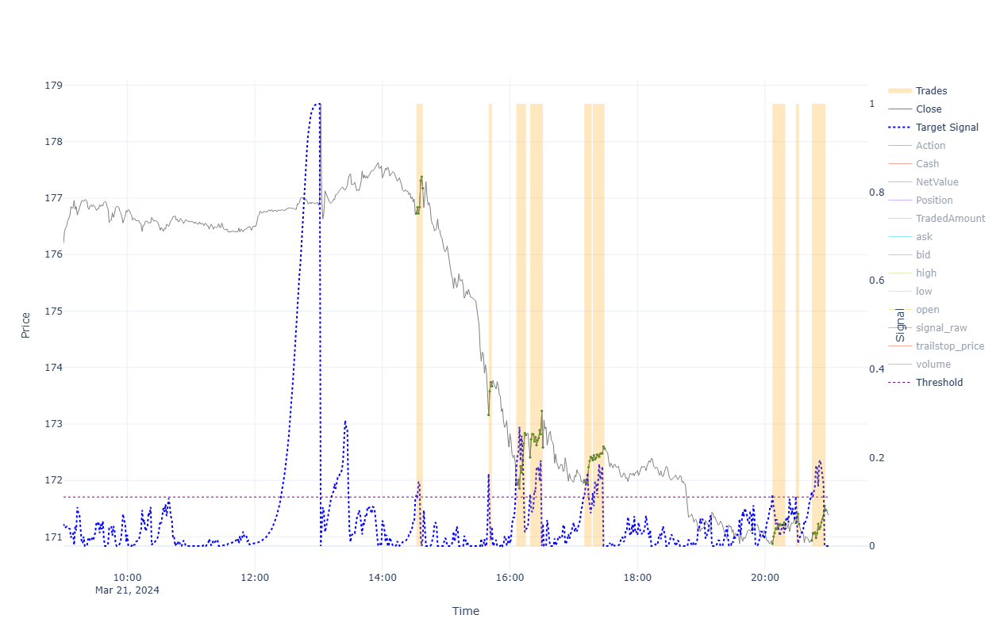


=== Performance for 2024-03-21 ===

BUY&HOLD:
  Bid(0) 171.356 - Ask(0) 177.465 - Fee(0) [0.004+0.028] = -6.142
TRADES:
  Bid(1) 177.14 - Ask(1) 176.765 - Fee(1) [0.004+0.029] = 0.342
  Bid(2) 173.635 - Ask(2) 173.195 - Fee(2) [0.004+0.028] = 0.409
  Bid(3) 172.77 - Ask(3) 171.994 - Fee(3) [0.004+0.028] = 0.744
  Bid(4) 172.55 - Ask(4) 172.445 - Fee(4) [0.004+0.028] = 0.074
  Bid(5) 172.36 - Ask(5) 172.038 - Fee(5) [0.004+0.028] = 0.289
  Bid(6) 172.53 - Ask(6) 172.397 - Fee(6) [0.004+0.028] = 0.102
  Bid(7) 171.176 - Ask(7) 170.914 - Fee(7) [0.004+0.028] = 0.23
  Bid(8) 171.191 - Ask(8) 171.284 - Fee(8) [0.004+0.028] = -0.125
  Bid(9) 171.436 - Ask(9) 170.969 - Fee(9) [0.004+0.028] = 0.435
STRATEGY:
  Trade(1) 0.342 + Trade(2) 0.409 + Trade(3) 0.744 + Trade(4) 0.074 + Trade(5) 0.289 + Trade(6) 0.102 + Trade(7) 0.23 + Trade(8) -0.125 + Trade(9) 0.435 = 2.5

------------------------------------------------------------------------------------------------------------------------



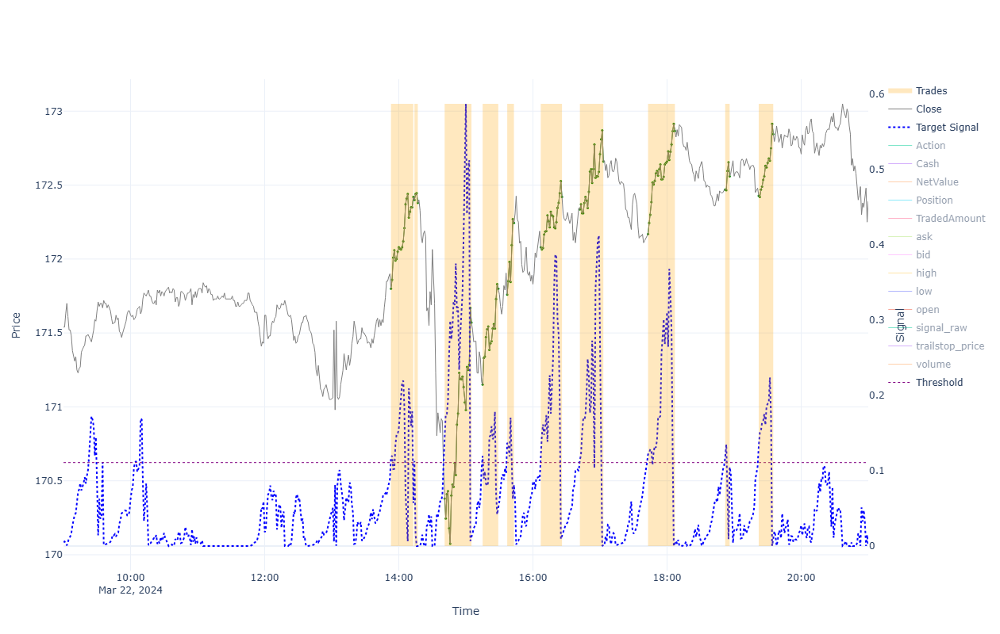


=== Performance for 2024-03-22 ===

BUY&HOLD:
  Bid(0) 172.356 - Ask(0) 171.514 - Fee(0) [0.004+0.028] = 0.809
TRADES:
  Bid(1) 172.386 - Ask(1) 171.834 - Fee(1) [0.004+0.028] = 0.519
  Bid(2) 172.345 - Ask(2) 172.435 - Fee(2) [0.004+0.028] = -0.121
  Bid(3) 171.536 - Ask(3) 170.414 - Fee(3) [0.004+0.028] = 1.09
  Bid(4) 171.765 - Ask(4) 171.185 - Fee(4) [0.004+0.028] = 0.548
  Bid(5) 172.211 - Ask(5) 171.794 - Fee(5) [0.004+0.028] = 0.384
  Bid(6) 172.386 - Ask(6) 172.114 - Fee(6) [0.004+0.028] = 0.239
  Bid(7) 172.625 - Ask(7) 172.369 - Fee(7) [0.004+0.028] = 0.224
  Bid(8) 172.831 - Ask(8) 172.204 - Fee(8) [0.004+0.028] = 0.595
  Bid(9) 172.525 - Ask(9) 172.504 - Fee(9) [0.004+0.028] = -0.011
  Bid(10) 172.81 - Ask(10) 172.463 - Fee(10) [0.004+0.028] = 0.315
STRATEGY:
  Trade(1) 0.519 + Trade(2) -0.121 + Trade(3) 1.09 + Trade(4) 0.548 + Trade(5) 0.384 + Trade(6) 0.239 + Trade(7) 0.224 + Trade(8) 0.595 + Trade(9) -0.011 + Trade(10) 0.315 = 3.782

------------------------------------

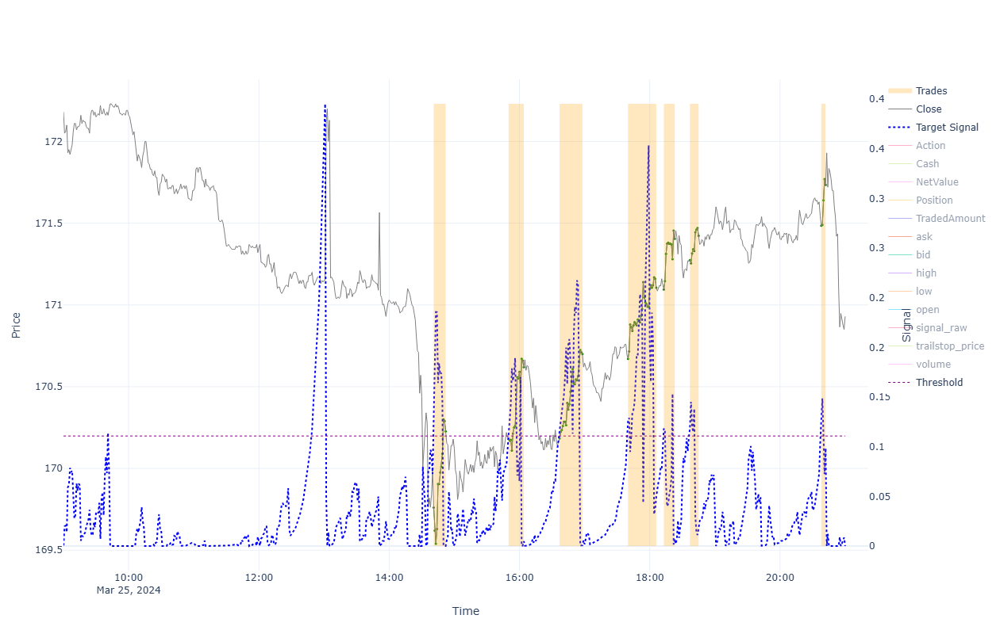


=== Performance for 2024-03-25 ===

BUY&HOLD:
  Bid(0) 170.896 - Ask(0) 171.134 - Fee(0) [0.004+0.028] = -0.27
TRADES:
  Bid(1) 170.193 - Ask(1) 169.794 - Fee(1) [0.004+0.028] = 0.367
  Bid(2) 170.586 - Ask(2) 170.214 - Fee(2) [0.004+0.028] = 0.34
  Bid(3) 170.666 - Ask(3) 170.219 - Fee(3) [0.004+0.028] = 0.415
  Bid(4) 171.071 - Ask(4) 170.704 - Fee(4) [0.004+0.028] = 0.335
  Bid(5) 171.371 - Ask(5) 171.129 - Fee(5) [0.004+0.028] = 0.21
  Bid(6) 171.388 - Ask(6) 171.308 - Fee(6) [0.004+0.028] = 0.048
  Bid(7) 171.701 - Ask(7) 171.519 - Fee(7) [0.004+0.028] = 0.15
STRATEGY:
  Trade(1) 0.367 + Trade(2) 0.34 + Trade(3) 0.415 + Trade(4) 0.335 + Trade(5) 0.21 + Trade(6) 0.048 + Trade(7) 0.15 = 1.865

------------------------------------------------------------------------------------------------------------------------



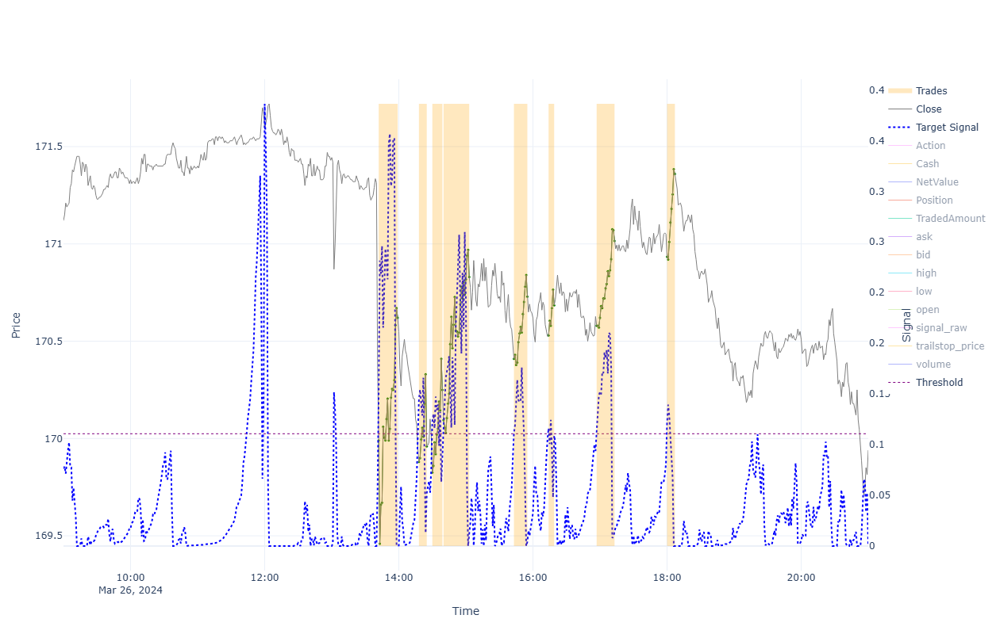


=== Performance for 2024-03-26 ===

BUY&HOLD:
  Bid(0) 169.906 - Ask(0) 171.324 - Fee(0) [0.004+0.028] = -1.45
TRADES:
  Bid(1) 170.586 - Ask(1) 170.024 - Fee(1) [0.004+0.028] = 0.53
  Bid(2) 169.926 - Ask(2) 169.914 - Fee(2) [0.004+0.028] = -0.02
  Bid(3) 170.216 - Ask(3) 169.859 - Fee(3) [0.004+0.028] = 0.325
  Bid(4) 170.796 - Ask(4) 170.129 - Fee(4) [0.004+0.028] = 0.635
  Bid(5) 170.696 - Ask(5) 170.444 - Fee(5) [0.004+0.028] = 0.22
  Bid(6) 170.651 - Ask(6) 170.564 - Fee(6) [0.004+0.028] = 0.055
  Bid(7) 170.981 - Ask(7) 170.614 - Fee(7) [0.004+0.028] = 0.335
  Bid(8) 171.325 - Ask(8) 170.968 - Fee(8) [0.004+0.028] = 0.325
STRATEGY:
  Trade(1) 0.53 + Trade(2) -0.02 + Trade(3) 0.325 + Trade(4) 0.635 + Trade(5) 0.22 + Trade(6) 0.055 + Trade(7) 0.335 + Trade(8) 0.325 = 2.405

------------------------------------------------------------------------------------------------------------------------



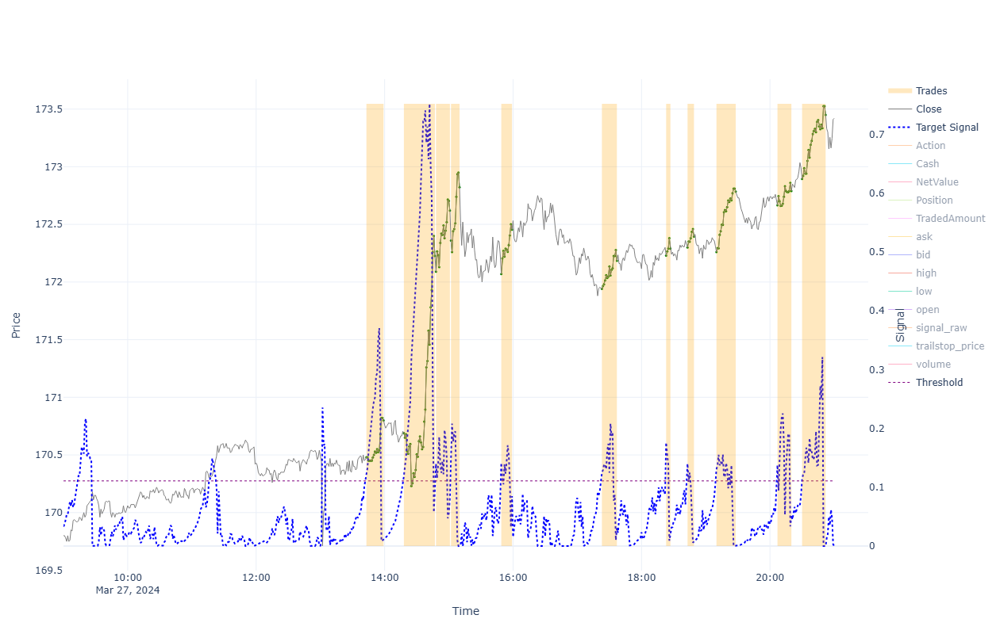


=== Performance for 2024-03-27 ===

BUY&HOLD:
  Bid(0) 173.385 - Ask(0) 170.484 - Fee(0) [0.004+0.028] = 2.869
TRADES:
  Bid(1) 170.766 - Ask(1) 170.514 - Fee(1) [0.004+0.028] = 0.22
  Bid(2) 172.191 - Ask(2) 170.724 - Fee(2) [0.004+0.028] = 1.435
  Bid(3) 172.585 - Ask(3) 172.124 - Fee(3) [0.004+0.028] = 0.429
  Bid(4) 172.787 - Ask(4) 172.395 - Fee(4) [0.004+0.028] = 0.36
  Bid(5) 172.421 - Ask(5) 172.104 - Fee(5) [0.004+0.028] = 0.284
  Bid(6) 172.151 - Ask(6) 171.974 - Fee(6) [0.004+0.028] = 0.144
  Bid(7) 172.256 - Ask(7) 172.264 - Fee(7) [0.004+0.028] = -0.041
  Bid(8) 172.359 - Ask(8) 172.334 - Fee(8) [0.004+0.028] = -0.007
  Bid(9) 172.75 - Ask(9) 172.294 - Fee(9) [0.004+0.028] = 0.424
  Bid(10) 172.755 - Ask(10) 172.7 - Fee(10) [0.004+0.028] = 0.024
  Bid(11) 173.415 - Ask(11) 172.93 - Fee(11) [0.004+0.028] = 0.454
STRATEGY:
  Trade(1) 0.22 + Trade(2) 1.435 + Trade(3) 0.429 + Trade(4) 0.36 + Trade(5) 0.284 + Trade(6) 0.144 + Trade(7) -0.041 + Trade(8) -0.007 + Trade(9) 0.424 

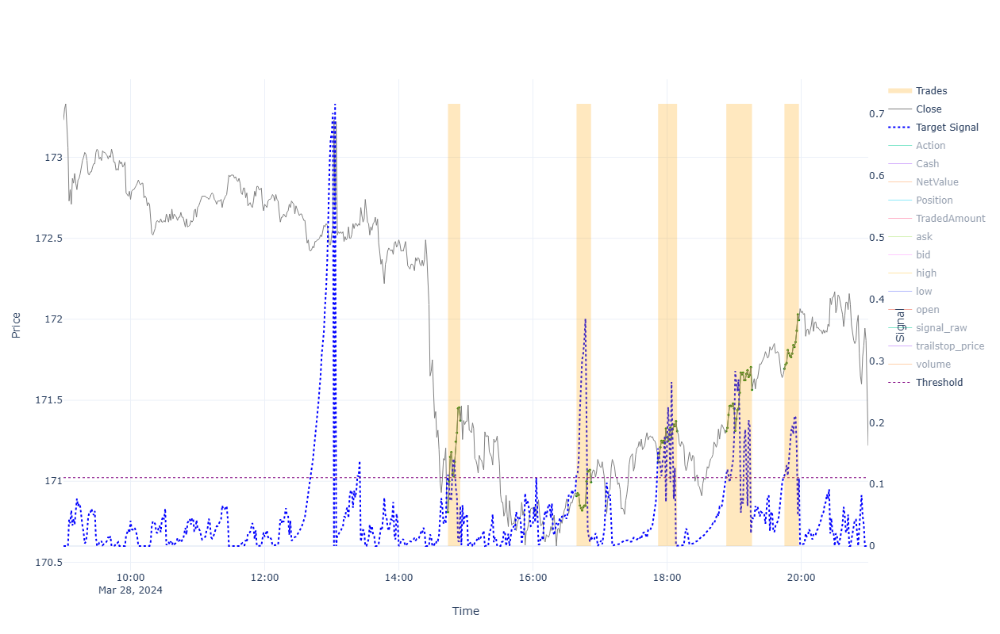


=== Performance for 2024-03-28 ===

BUY&HOLD:
  Bid(0) 171.186 - Ask(0) 172.774 - Fee(0) [0.004+0.028] = -1.621
TRADES:
  Bid(1) 171.341 - Ask(1) 170.844 - Fee(1) [0.004+0.028] = 0.465
  Bid(2) 170.961 - Ask(2) 170.944 - Fee(2) [0.004+0.028] = -0.015
  Bid(3) 171.276 - Ask(3) 171.154 - Fee(3) [0.004+0.028] = 0.09
  Bid(4) 171.531 - Ask(4) 171.344 - Fee(4) [0.004+0.028] = 0.155
  Bid(5) 171.961 - Ask(5) 171.729 - Fee(5) [0.004+0.028] = 0.199
STRATEGY:
  Trade(1) 0.465 + Trade(2) -0.015 + Trade(3) 0.09 + Trade(4) 0.155 + Trade(5) 0.199 = 0.894

------------------------------------------------------------------------------------------------------------------------


Overall Summary (2024-03-01 = 180.916 → 2024-03-28 = 171.186)
Num. trading days: 20
Trades Count: 196

One-Time B&H gain: -9.730
Sum Strategy gain: 67.880
Sum Intraday B&H gain: -8.685

One-Time B&H gain per day: -0.4865
Strategy gain per day: 3.3940
Strategy gain per trade: 0.3463


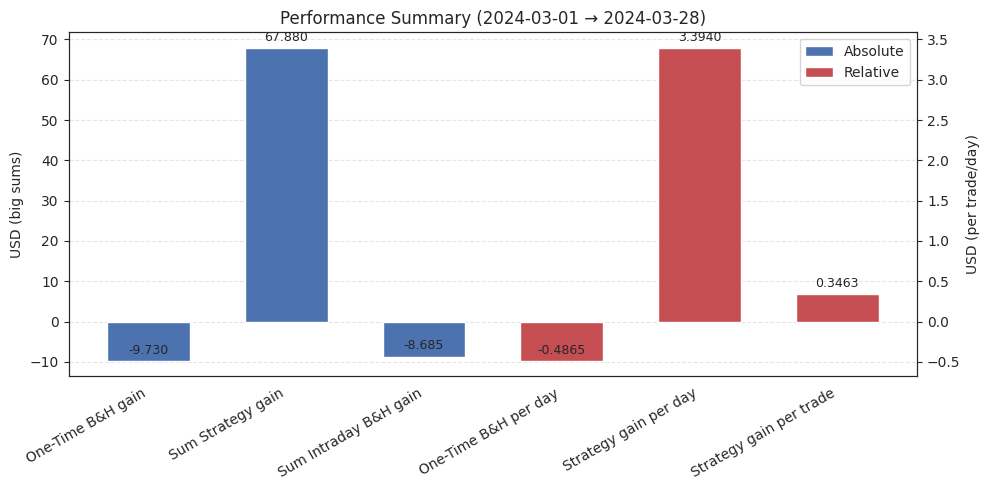


Overall Summary (2004-01-02 = 0.764 → 2025-06-18 = 196.501)
Num. trading days: 5400
Trades Count: 61642

One-Time B&H gain: 195.736
Sum Strategy gain: 7503.468
Sum Intraday B&H gain: -34.569

One-Time B&H gain per day: 0.0362
Strategy gain per day: 1.3895
Strategy gain per trade: 0.1217


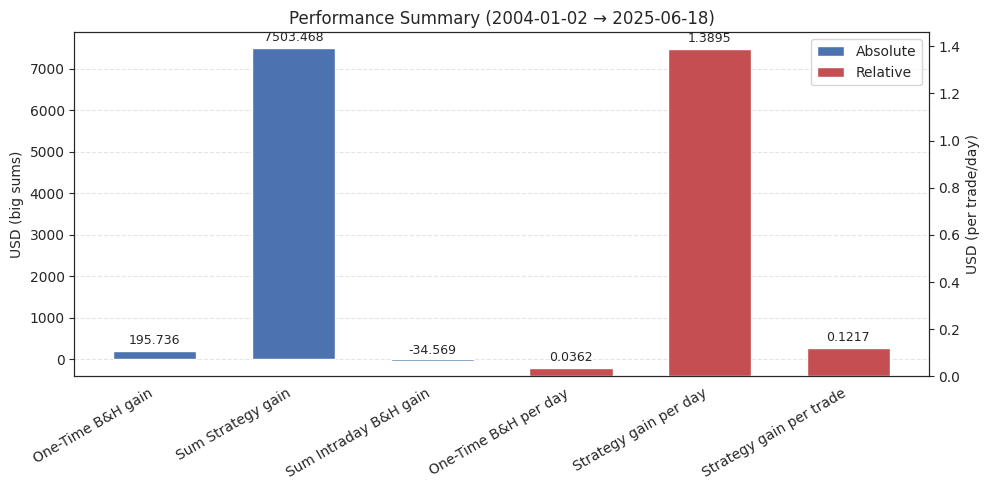

In [5]:
importlib.reload(plots)

year, month = map(int, params.month_to_check.split("-"))
days_in_month = [d for d in sim_results if d.year == year and d.month == month]

if not days_in_month:
    print(f"No simulation data for {params.month_to_check}")
else:
    for day in sorted(days_in_month):
        df_day, trades_day, stats_day = sim_results[day]
        plots.plot_trades(
            df                 = df_day,
            col_signal1        = "signal",
            col_signal2        = False,
            buy_thresh         = best_optuna_params["buy_thresh"],
            trades             = trades_day,
            performance_stats  = stats_day,
        )
        
        print(f"\n=== Performance for {day} ===\n")
        for k, v in stats_day.items():
            lines = v if isinstance(v, list) else str(v).splitlines()
            print(f"{k}:")
            for L in lines:
                print("  " + L)
        print("\n" + "-" * 120 + "\n")

# monthly / overall aggregates
df_month = df[df.index.to_period("M") == params.month_to_check]
plots.aggregate_performance([sim_results[d][2] for d in sorted(days_in_month)], df_month)
plots.aggregate_performance([sim_results[d][2] for d in sorted(sim_results)], df)


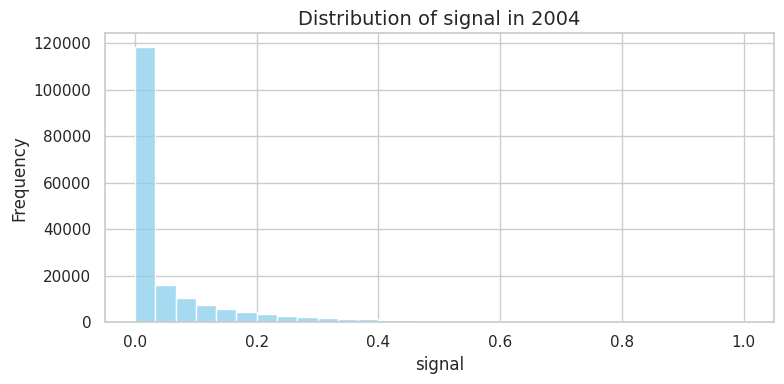

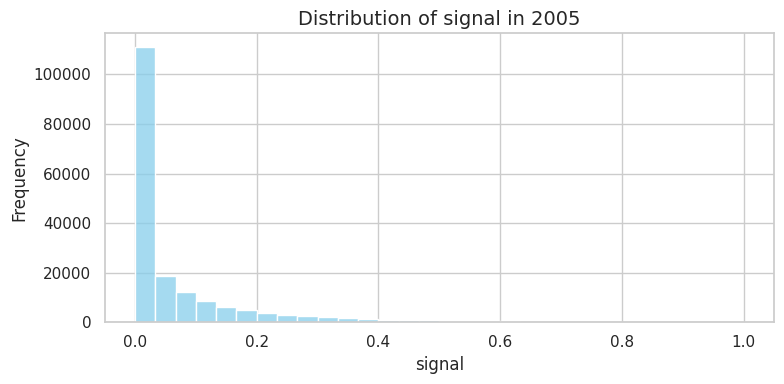

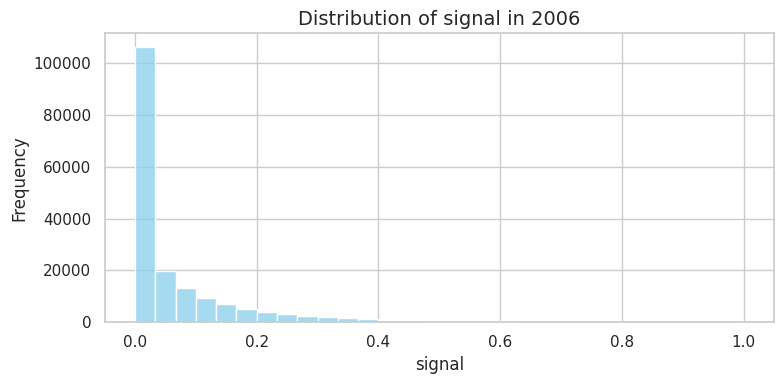

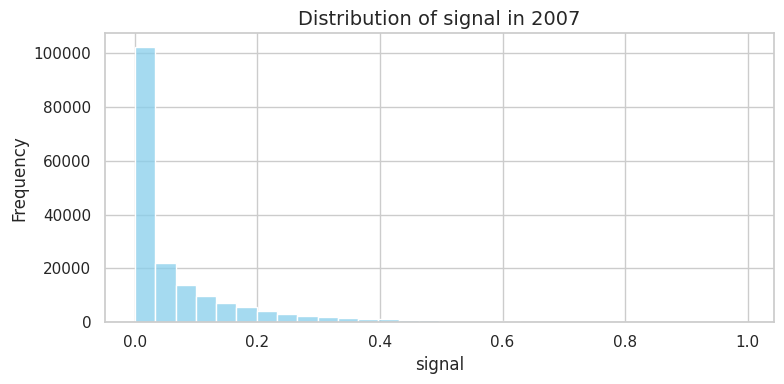

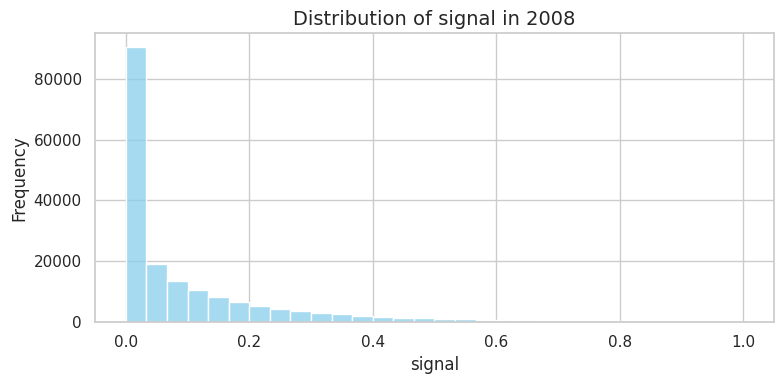

...

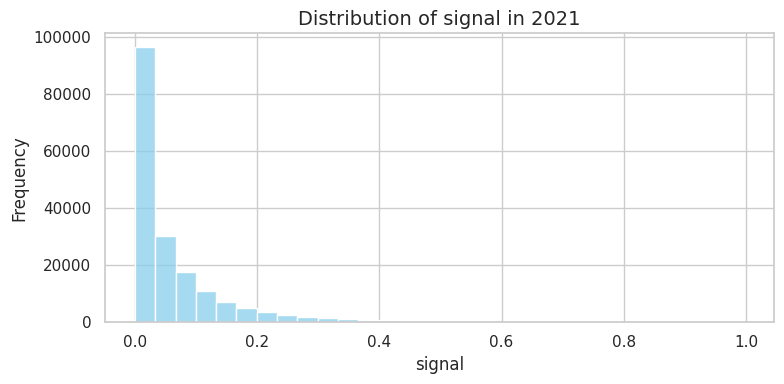

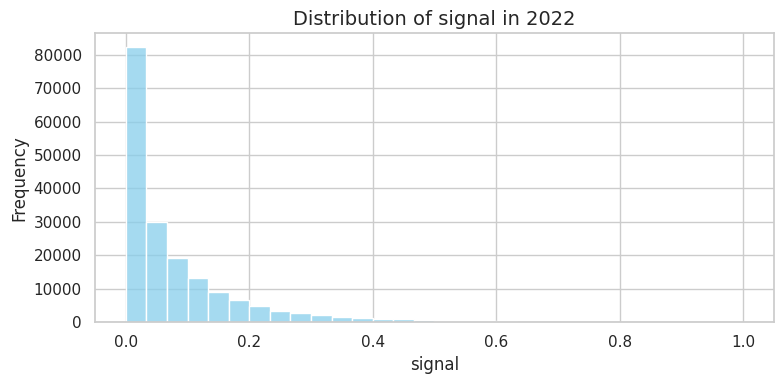

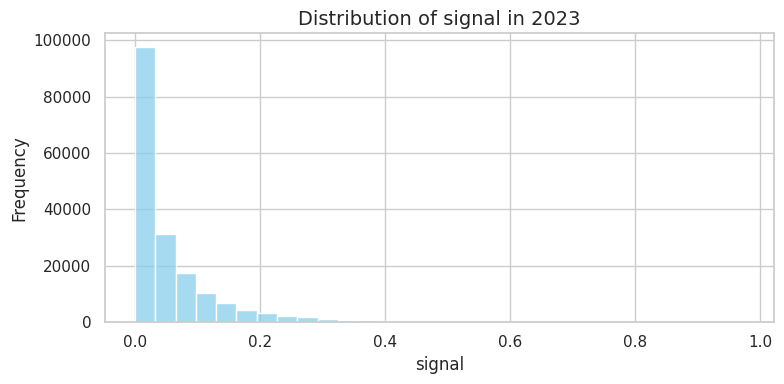

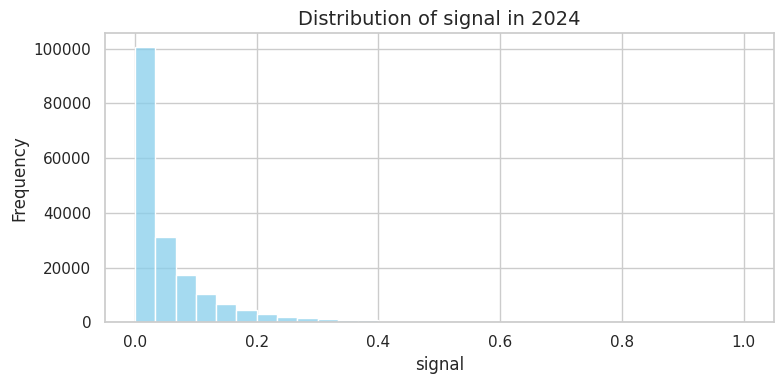

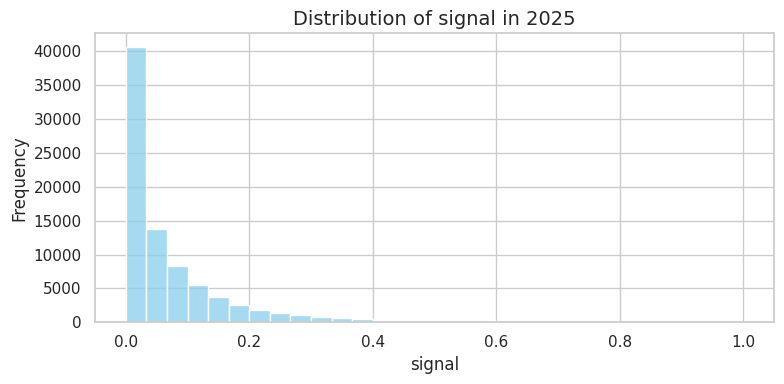

,signal_min,signal_max,signal_mean,signal_median,close_return
2004-01,0.0,0.997404,0.069979,0.004466,0.170916
2004-02,0.0,0.999896,0.057326,0.001795,0.105893
2004-03,0.0,0.999834,0.072029,0.004822,0.196335
2004-04,0.0,0.986393,0.063282,0.002331,0.156863
2004-05,0.0,0.966429,0.068010,0.002053,0.127743
...,...,...,...,...,...
2025-02,0.0,0.859984,0.062099,0.027423,0.105627
2025-03,0.0,0.820408,0.072986,0.035085,0.168574
2025-04,0.0,1.000000,0.121015,0.058426,0.338585
2025-05,0.0,0.876200,0.070335,0.034460,0.109857


In [6]:
pd.set_option('display.max_columns', None)

# Group by month
period = df_sim.index.to_period('M')

# Monthly stats for signal
signal_stats = df_sim.groupby(period)['signal'].agg(
    signal_min='min',
    signal_max='max',
    signal_mean='mean',
    signal_median='median'
)

# Monthly close return: (max - min) / min
close_return = df_sim.groupby(period)['close'].agg(
    close_return=lambda x: np.nan if x.min() == 0 else (x.max() - x.min()) / x.min()
)

# Combine into one DataFrame
monthly_stats = signal_stats.join(close_return)


# --------------------------------------------------
# Now plot histograms of signal for each year
# --------------------------------------------------

sns.set(style="whitegrid")
unique_years = sorted(df_sim.index.year.unique())

for y in unique_years:
    subset = df_sim[df_sim.index.year == y]['signal']
    
    plt.figure(figsize=(8, 4))
    sns.histplot(subset, bins=30, kde=False, color="skyblue")
    plt.title(f"Distribution of signal in {y}", fontsize=14)
    plt.xlabel("signal", fontsize=12)
    plt.ylabel("Frequency", fontsize=12)
    plt.tight_layout()
    plt.show()

monthly_stats


In [7]:
# Save the full-run signals CSV
print(f"\nSaving full-run signals to {params.sign_csv} …")
df_sim.to_csv(params.sign_csv)
print("CSV saved.")


Saving full-run signals to dfs/AAPL_2_sign.csv …
CSV saved.
